In [90]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import glob

### Constants

In [91]:
DATA_DIR = 'WarpDoc'
DIGITAL = os.path.join(DATA_DIR, 'digital')
DISTORTED = os.path.join(DATA_DIR, 'distorted')
TARGET_WIDTH = 512

In [92]:
processed_images = {}
ground_truth = {}

### Reading and processing images

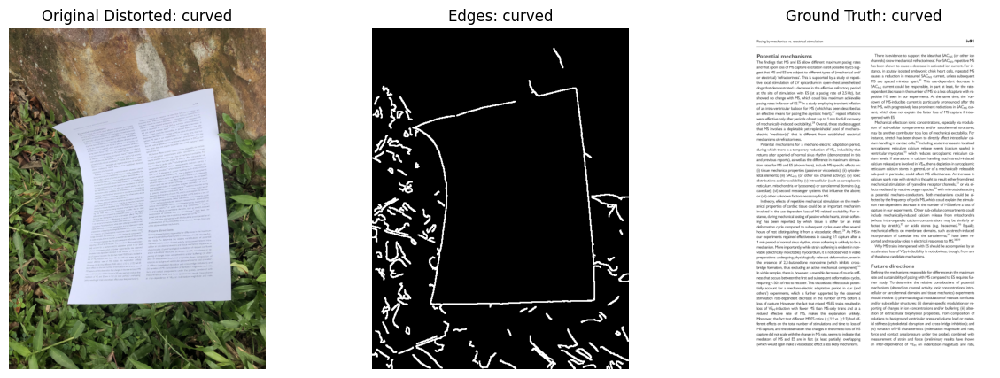

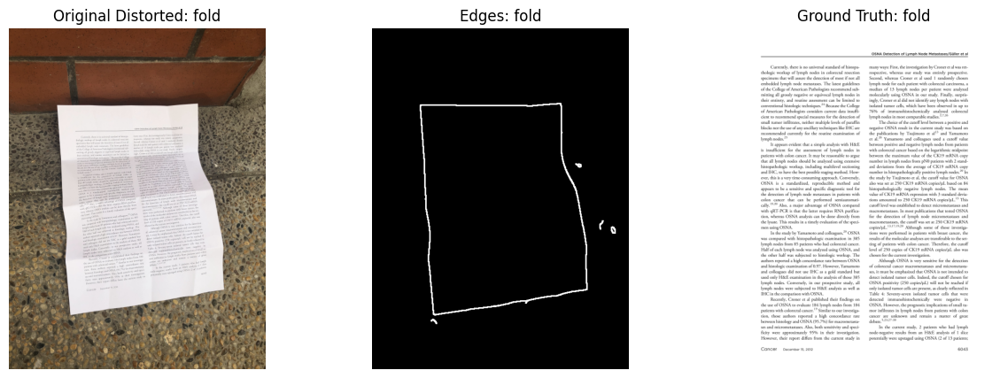

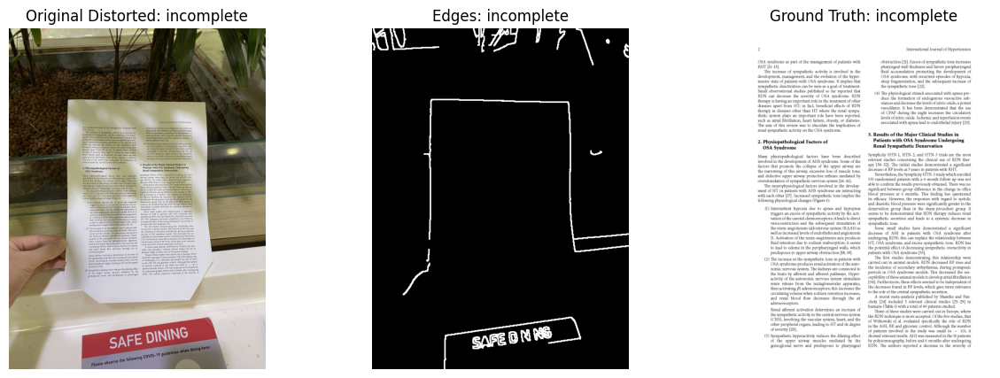

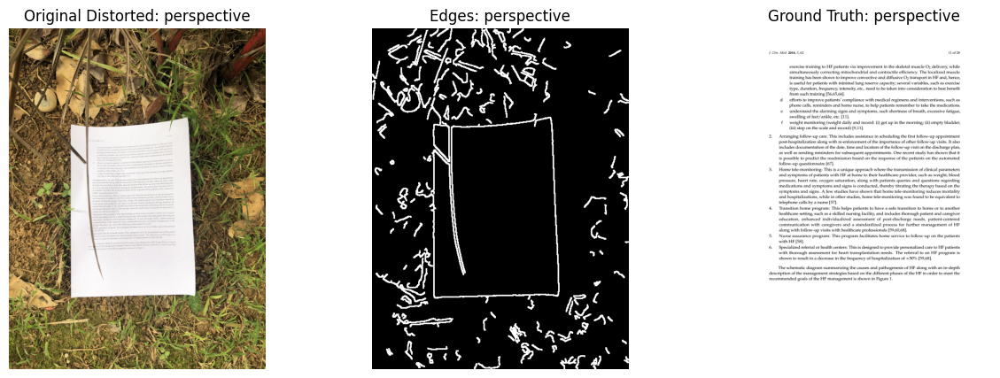

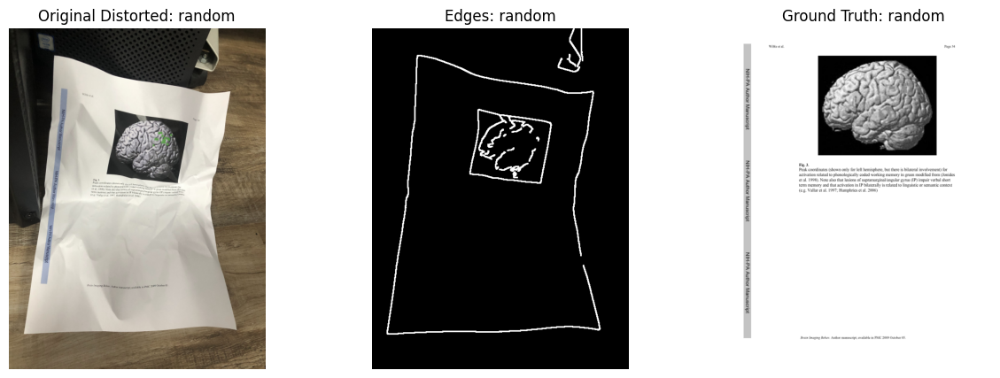

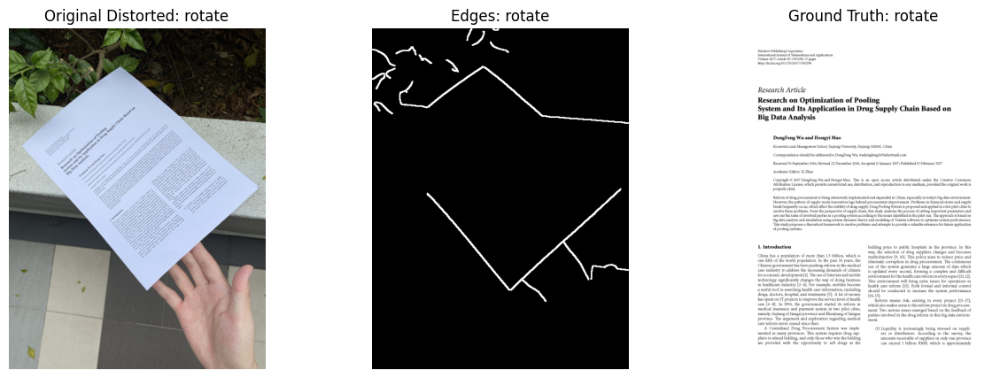

In [93]:
# reading and processing images
for category in os.listdir(DIGITAL):
    digital_category = os.path.join(DIGITAL, category)
    distorted_category = os.path.join(DISTORTED, category)

    digital_paths = glob.glob(os.path.join(digital_category, "*.jpg"))  
    distorted_paths = glob.glob(os.path.join(distorted_category, "*.jpg"))

    # init
    processed_images[category] = []
    ground_truth[category] = []

    for dig_path, dist_path in zip(sorted(digital_paths), sorted(distorted_paths)):
        dig_image = cv2.imread(dig_path)
        dist_image = cv2.imread(dist_path)

        scale = TARGET_WIDTH / dist_image.shape[1]  # Resize width
        new_size = (TARGET_WIDTH, int(dist_image.shape[0] * scale))

        dig_image = cv2.resize(dig_image, new_size, interpolation=cv2.INTER_AREA)
        dist_image = cv2.resize(dist_image, new_size, interpolation=cv2.INTER_AREA)

        # convert to grayscale
        dig_gray = cv2.cvtColor(dig_image, cv2.COLOR_BGR2GRAY)
        dist_gray = cv2.cvtColor(dist_image, cv2.COLOR_BGR2GRAY)

        # Gaussian Blur to reduce noise
        blurred = cv2.GaussianBlur(dist_gray, (9, 9), 0)

        edges = cv2.Canny(blurred, 100, 200)

        # clean up edges
        kernel = np.ones((3, 3), np.uint8)
        edges = cv2.dilate(edges, kernel, iterations=1)  # close gaps

        ground_truth[category].append(dig_gray)
        processed_images[category].append(edges)

        # to visualize one for each category
        if len(processed_images[category]) == 1:
            plt.figure(figsize=(15, 5))
            plt.subplot(1, 3, 1)
            plt.imshow(cv2.cvtColor(dist_image, cv2.COLOR_BGR2RGB))
            plt.title(f'Original Distorted: {category}')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(edges, cmap='gray')
            plt.title(f'Edges: {category}')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(dig_gray, cmap='gray')
            plt.title(f'Ground Truth: {category}')
            plt.axis('off')

            plt.show()

In [94]:
def hough_transform(edges, theta_res=1, rho_res=1):
    """
    Function to perform Hough Transform on the edges of an image

    :param edges: edge image
    :param theta_res: resolution of theta values
    :param rho_res: resolution of rho values

    :return: votes, thetas, rhos
    """
    h, w = edges.shape

    thetas = np.deg2rad(np.arange(-90, 90, theta_res))

    diag_len = int(np.sqrt(h**2 + w**2))  # Max possible rho
    rhos = np.arange(-diag_len, diag_len, rho_res)

    votes = np.zeros((len(rhos), len(thetas)), dtype=np.int32)

    # edge coordinates
    y_idxs, x_idxs = np.nonzero(edges)  

    cos_thetas = np.cos(thetas)
    sin_thetas = np.sin(thetas)
    
    rhos_matrix = np.outer(x_idxs, cos_thetas) + np.outer(y_idxs, sin_thetas)
    rho_idxs = np.round((rhos_matrix - rhos[0]) / rho_res).astype(int)

    theta_indices = np.tile(np.arange(len(thetas)), len(x_idxs))
    rho_indices = rho_idxs.ravel()

    valid_mask = (rho_indices >= 0) & (rho_indices < len(rhos))  # Ignore out-of-bounds
    np.add.at(votes, (rho_indices[valid_mask], theta_indices[valid_mask]), 1)

    return votes, thetas, rhos

In [95]:
votes, thetas, rhos = {}, {}, {}

### Applying Hough Transform

In [96]:
for category in processed_images: 
    votes[category] = []
    thetas[category] = []
    rhos[category] = []

    for edges in processed_images[category]:
        v, t, r = hough_transform(edges)
        votes[category].append(v)
        thetas[category].append(t)
        rhos[category].append(r)

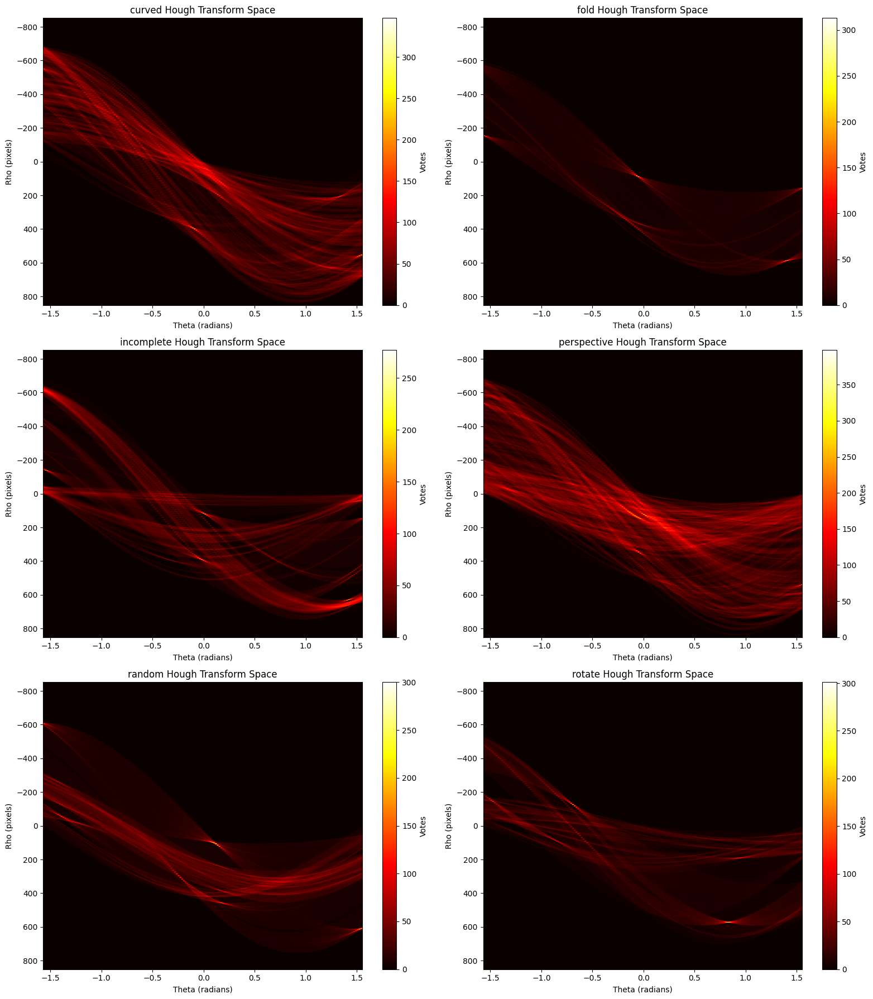

In [97]:
plt.figure(figsize=(16, 18))

for i, category in enumerate(processed_images):
    plt.subplot(3, 2, i+1)
    vote, theta, rho = votes[category][0], thetas[category][0], rhos[category][0]
    plt.imshow(vote, cmap='hot', aspect='auto', extent=[theta[0], theta[-1], rho[-1], rho[0]])
    plt.title(f"{category} Hough Transform Space")
    plt.xlabel("Theta (radians)")
    plt.ylabel("Rho (pixels)")
    plt.colorbar(label="Votes")

plt.tight_layout()
plt.show()

---

In [98]:
def find_hough_peaks(votes, thetas, rhos, threshold_ratio=0.5, max_lines=20):
    """
    Function to find peaks in Hough space

    :param votes: Hough space
    :param thetas: theta values
    :param rhos: rho values
    :param threshold_ratio: ratio of max vote count to consider as peak
    :param max_lines: maximum number of lines to return

    :return: lines
    """
    threshold = threshold_ratio * np.max(votes)
    peaks = []
    
    for i in range(1, votes.shape[0] - 1):
        for j in range(1, votes.shape[1] - 1):
            window = votes[i-1:i+2, j-1:j+2]
            if votes[i, j] == np.max(window) and votes[i, j] >= threshold:
                peaks.append((i, j, votes[i, j]))  # (rho_idx, theta_idx, vote_count)
    
    # sort peaks by vote count 
    peaks.sort(key=lambda x: x[2], reverse=True)
    peaks = peaks[:max_lines]
    
    lines = []
    for rho_idx, theta_idx, _ in peaks:
        rho = rhos[rho_idx]
        theta = thetas[theta_idx]
        lines.append((rho, theta))
    
    return lines


def line_points_from_hough(rho, theta, img_shape):
    """"
    Function to find two points on a line given rho and theta

    :param rho: distance from origin
    :param theta: angle from x-axis
    :param img_shape: shape of the image

    :return: (x1, y1), (x2, y2)
    """
    h, w = img_shape
    cos_t, sin_t = np.cos(theta), np.sin(theta)
    
    if abs(sin_t) < 1e-10:  # vertical line
        x1 = x2 = int(rho / cos_t)
        y1, y2 = 0, h-1
    else:
        x1, y1 = 0, int(rho / sin_t)
        x2, y2 = w-1, int((rho - (w-1) * cos_t) / sin_t)
        
    # out-of-bounds points
    if y1 < 0 or y1 >= h:
        x1 = int((rho - 0 * sin_t) / cos_t) if abs(cos_t) > 1e-10 else 0
        y1 = 0
    if y2 < 0 or y2 >= h:
        x2 = int((rho - (h-1) * sin_t) / cos_t) if abs(cos_t) > 1e-10 else w-1
        y2 = h-1
    
    return (x1, y1), (x2, y2)

### Finding Hough lines using peaks

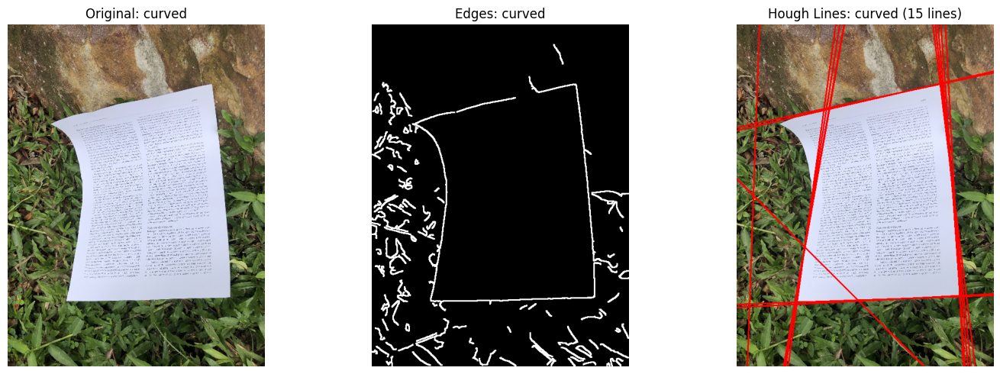

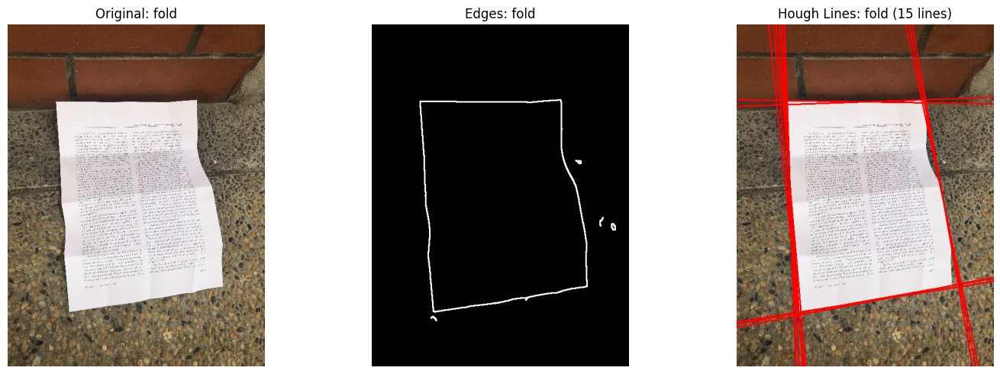

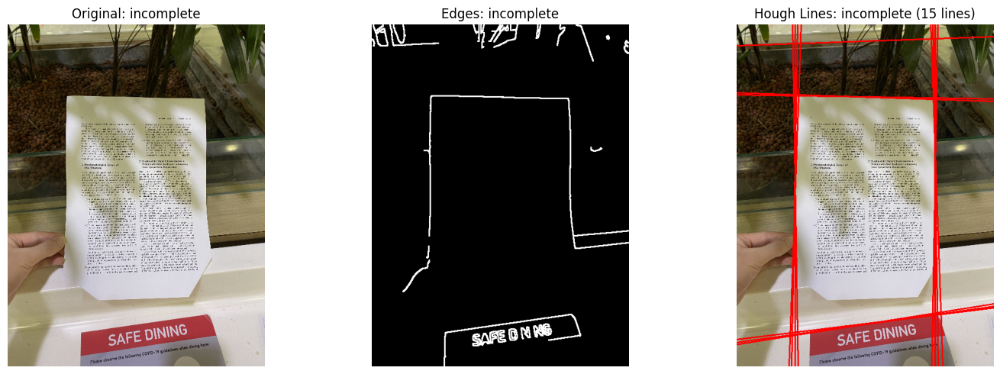

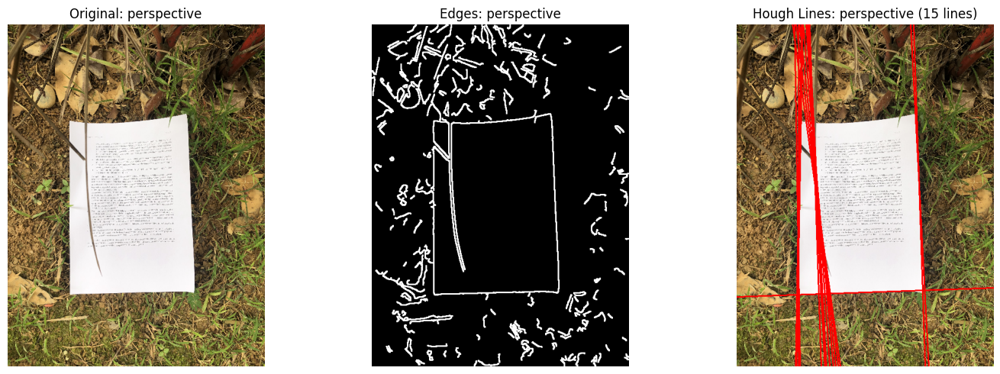

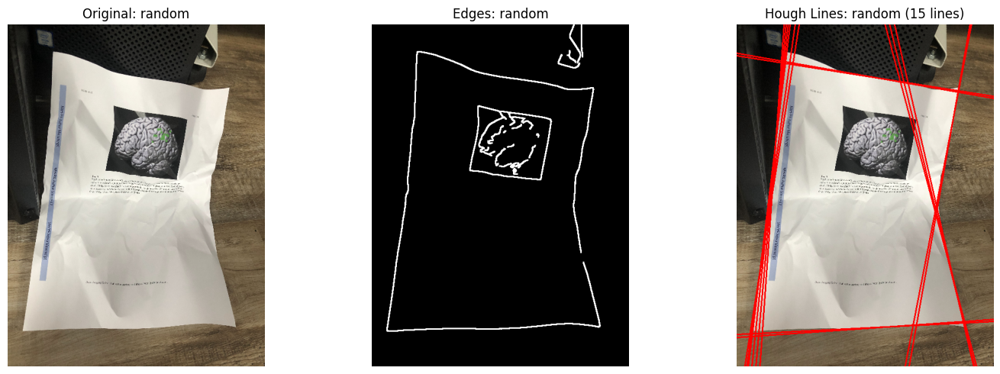

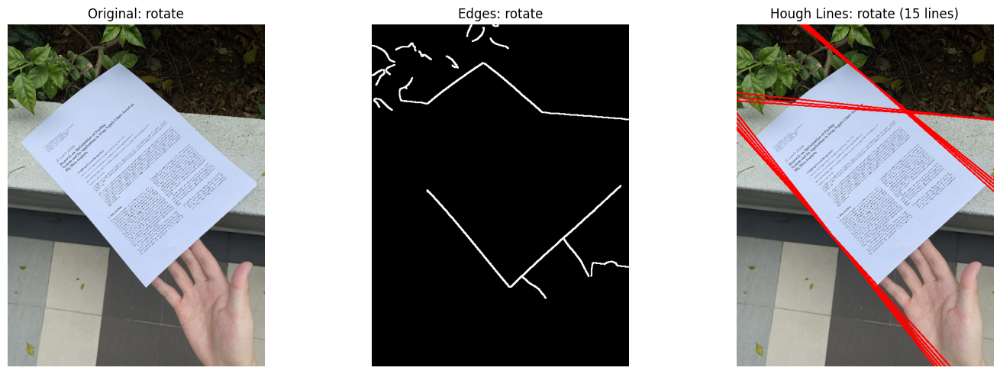

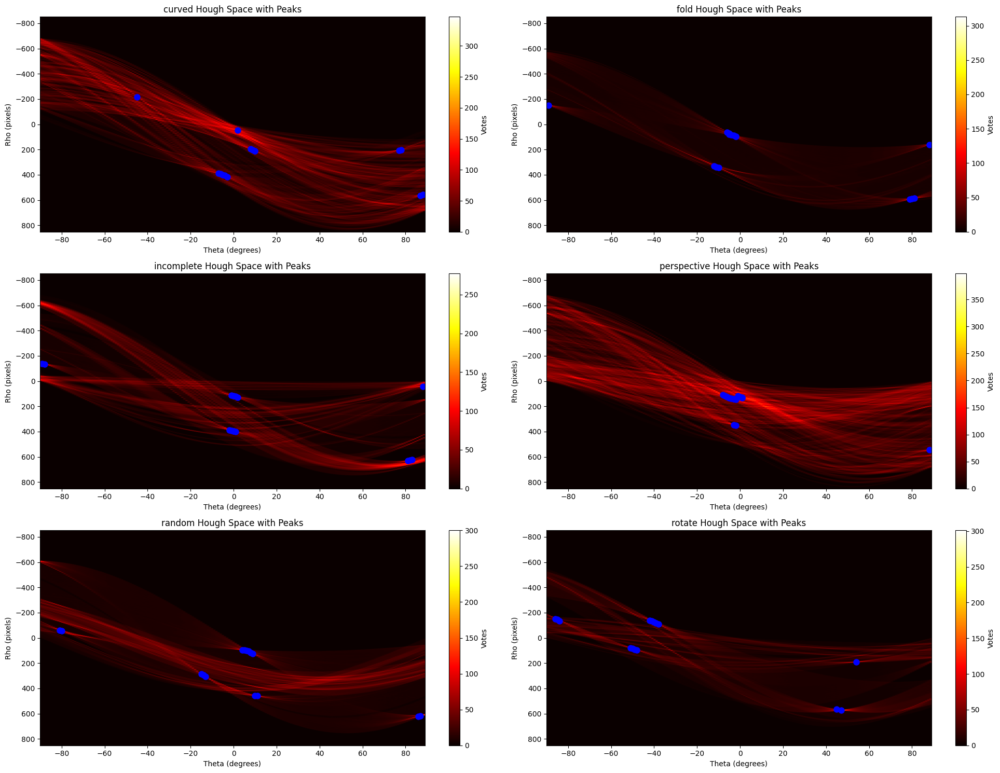

In [99]:
hough_lines = {}
line_endpoints = {}

for category in processed_images:
    hough_lines[category] = []
    line_endpoints[category] = []
    
    for i, edges in enumerate(processed_images[category]):
        # original distorted image for visualization
        dist_path = sorted(glob.glob(os.path.join(DISTORTED, category, "*.jpg")))[i]
        dist_image = cv2.imread(dist_path)
        scale = TARGET_WIDTH / dist_image.shape[1]
        dist_image = cv2.resize(dist_image, (TARGET_WIDTH, int(dist_image.shape[0] * scale)))
        
        # significant lines 
        v, t, r = votes[category][i], thetas[category][i], rhos[category][i]
        detected_lines = find_hough_peaks(v, t, r, threshold_ratio=0.4, max_lines=15)
        hough_lines[category].append(detected_lines)
        
        endpoints = []
        for rho, theta in detected_lines:
            line_pts = line_points_from_hough(rho, theta, edges.shape)
            endpoints.append(line_pts)
        
        line_endpoints[category].append(endpoints)
        
        line_vis = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR) if len(edges.shape) == 2 else edges.copy()
        orig_vis = dist_image.copy()
        
        # Draw lines on images
        for (pt1, pt2) in endpoints:
            cv2.line(line_vis, pt1, pt2, (0, 0, 255), 2)
            cv2.line(orig_vis, pt1, pt2, (0, 0, 255), 2)
            
        if i == 0:
            plt.figure(figsize=(15, 5))
            
            plt.subplot(1, 3, 1)
            plt.imshow(cv2.cvtColor(dist_image, cv2.COLOR_BGR2RGB))
            plt.title(f'Original: {category}')
            plt.axis('off')
            
            plt.subplot(1, 3, 2)
            plt.imshow(edges, cmap='gray')
            plt.title(f'Edges: {category}')
            plt.axis('off')
            
            plt.subplot(1, 3, 3)
            plt.imshow(cv2.cvtColor(orig_vis, cv2.COLOR_BGR2RGB))
            plt.title(f'Hough Lines: {category} ({len(endpoints)} lines)')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()

plt.figure(figsize=(20, 15))

for i, category in enumerate(processed_images):
    plt.subplot(3, 2, i+1)
    v, t, r = votes[category][0], thetas[category][0], rhos[category][0]
    
    plt.imshow(v, cmap='hot', aspect='auto', extent=[np.rad2deg(t[0]), np.rad2deg(t[-1]), r[-1], r[0]])
    
    for rho, theta in hough_lines[category][0]:
        theta_deg = np.rad2deg(theta)
        plt.plot(theta_deg, rho, 'bo', markersize=8)
    
    plt.title(f"{category} Hough Space with Peaks")
    plt.xlabel("Theta (degrees)")
    plt.ylabel("Rho (pixels)")
    plt.colorbar(label="Votes")

plt.tight_layout()
plt.show()

In [100]:
def extract_edge_points(edges):
    """
    Function to extract edge points from edge image

    :param edges: edge image

    :return: edge points
    """
    y_idxs, x_idxs = np.nonzero(edges)
    
    # if no edge points found
    if len(y_idxs) == 0:
        return np.empty((0, 2))
    
    return np.column_stack((x_idxs, y_idxs))

def ransac_line_fitting(edge_points, lines, iterations=100, threshold=3.0, min_inliers=20):
    """
    Function to fit lines using RANSAC

    :param edge_points: edge points
    :param lines: lines from Hough Transform
    :param iterations: number of iterations
    :param threshold: distance threshold for inliers
    :param min_inliers: minimum number of inliers

    :return: refined_lines
    """
    refined_lines = []

    if len(edge_points) == 0:
        return refined_lines  # no edge points
    
    for rho, theta in lines:
        pt1, pt2 = line_points_from_hough(rho, theta, (np.max(edge_points[:, 1])+1, np.max(edge_points[:, 0])+1))
        x1, y1 = pt1
        x2, y2 = pt2
        
        if x2 - x1 == 0:  # vertical line
            a, b, c = 1, 0, -x1
        else:
            slope = (y2 - y1) / (x2 - x1)
            a = -slope
            b = 1
            c = slope * x1 - y1
        
        norm = np.sqrt(a**2 + b**2)
        a, b, c = a/norm, b/norm, c/norm
        
        best_inliers = []
        
        for _ in range(iterations):
            if len(edge_points) < 2:
                continue
                
            idx = np.random.choice(len(edge_points), 2, replace=False)
            p1, p2 = edge_points[idx]
            
            if np.array_equal(p1, p2):
                continue
            
            if p2[0] == p1[0]:  
                a_i, b_i, c_i = 1, 0, -p1[0]
            else:
                slope = (p2[1] - p1[1]) / (p2[0] - p1[0])
                a_i = -slope
                b_i = 1
                c_i = slope * p1[0] - p1[1]
            
            norm = np.sqrt(a_i**2 + b_i**2)
            a_i, b_i, c_i = a_i/norm, b_i/norm, c_i/norm
            
            distances = np.abs(a_i*edge_points[:, 0] + b_i*edge_points[:, 1] + c_i)
            inliers = np.where(distances < threshold)[0]
            
            if len(inliers) > len(best_inliers) and len(inliers) >= min_inliers:
                best_inliers = inliers
        
        if len(best_inliers) > 2:
            inlier_points = edge_points[best_inliers]
            
            x = inlier_points[:, 0]
            y = inlier_points[:, 1]
            
            if np.max(x) - np.min(x) < 5:
                a_r, b_r, c_r = 1, 0, -np.mean(x)
            else:
                slope, intercept = np.polyfit(x, y, 1)
                a_r = -slope
                b_r = 1
                c_r = -intercept
                
                norm = np.sqrt(a_r**2 + b_r**2)
                a_r, b_r, c_r = a_r/norm, b_r/norm, c_r/norm
                
            refined_lines.append((a_r, b_r, c_r))
    
    return refined_lines

### Applygin RANSAC line fitting

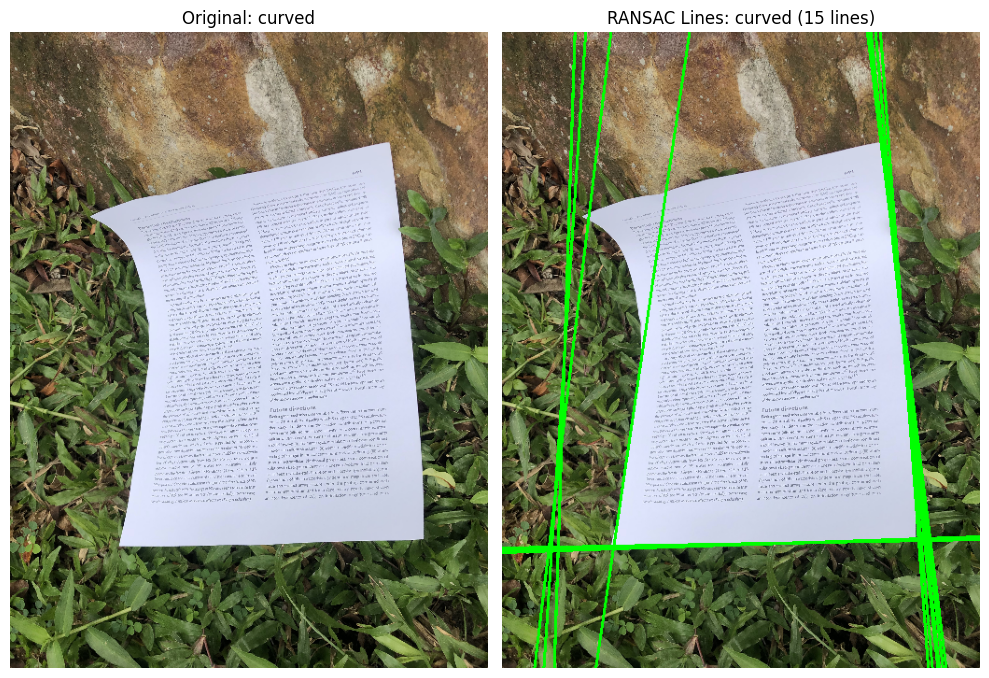

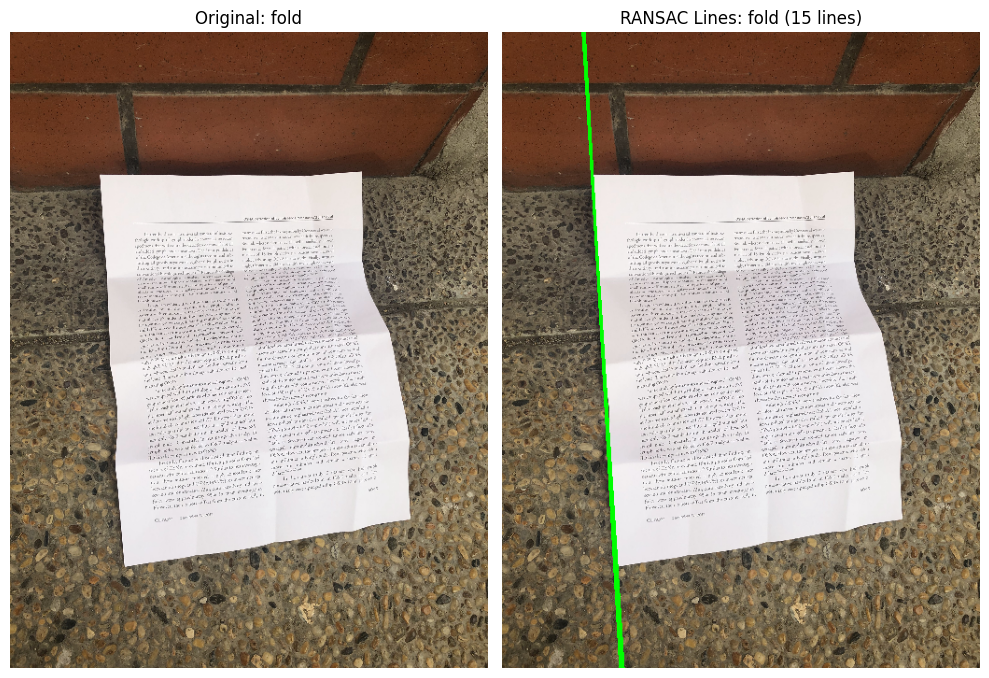

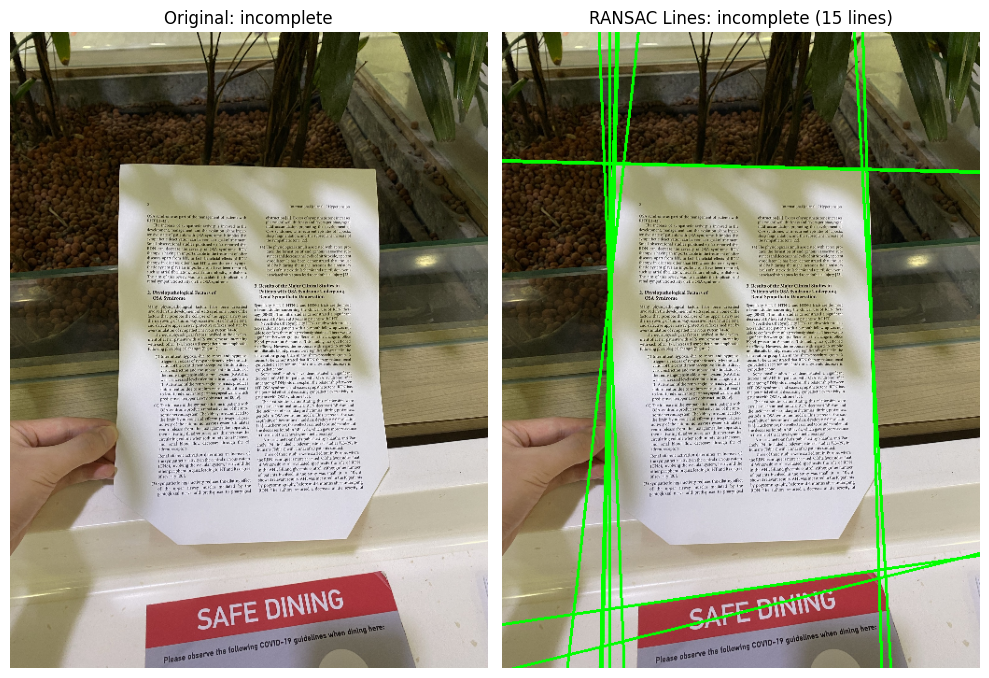

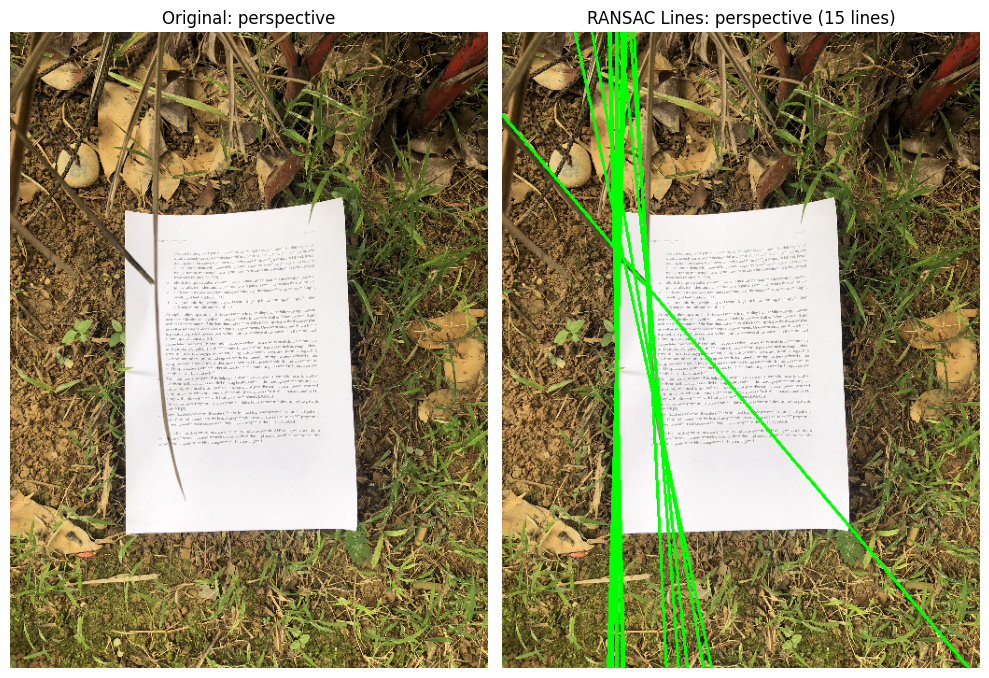

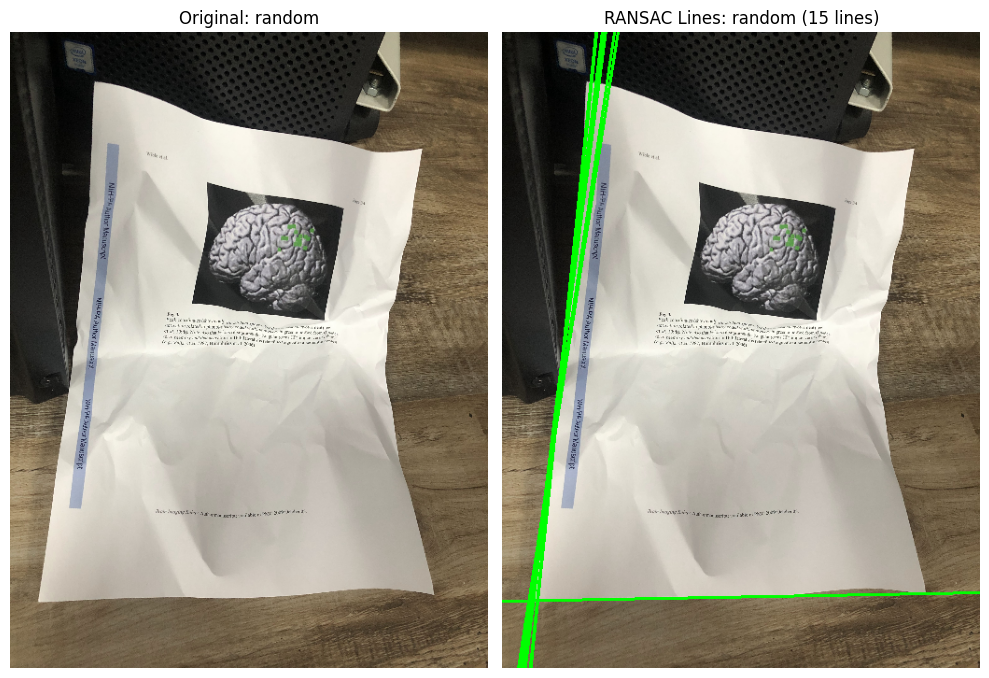

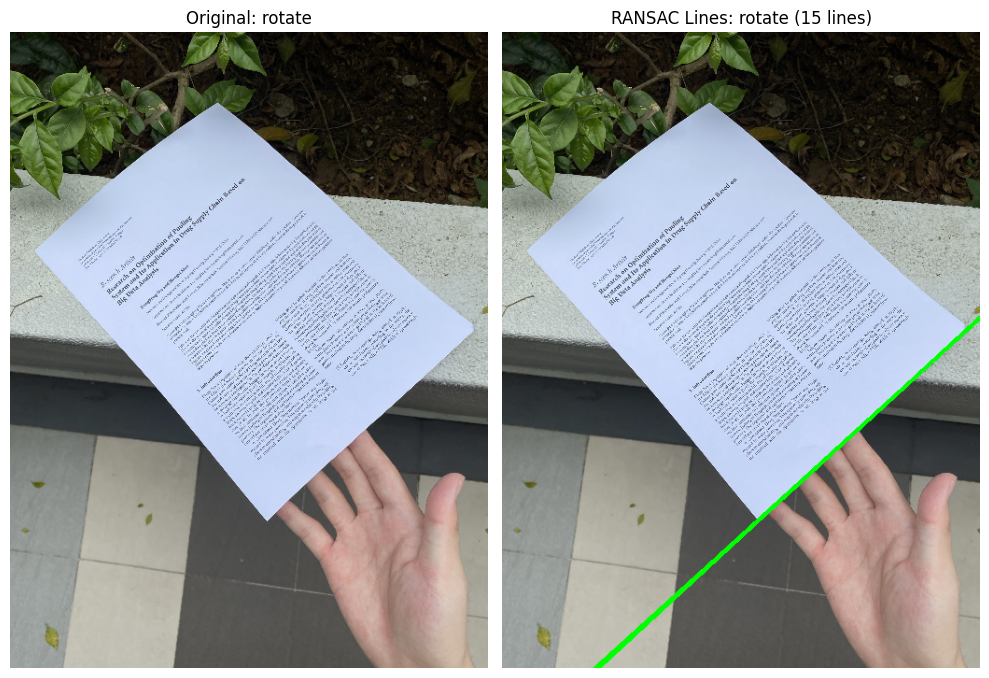

In [101]:
ransac_lines = {}

for category in processed_images:
    ransac_lines[category] = []
    
    for i, edges in enumerate(processed_images[category]):
        edge_pts = extract_edge_points(edges)

        if len(edge_pts) == 0:
            print(f"Warning: No edge points detected for {category} image {i}") # because for some reason I couldn't find any edge points for some images
            ransac_lines[category].append([])
            continue
        
        refined = ransac_line_fitting(edge_pts, hough_lines[category][i])
        ransac_lines[category].append(refined)
        
        dist_path = sorted(glob.glob(os.path.join(DISTORTED, category, "*.jpg")))[i]
        dist_image = cv2.imread(dist_path)
        scale = TARGET_WIDTH / dist_image.shape[1]
        dist_image = cv2.resize(dist_image, (TARGET_WIDTH, int(dist_image.shape[0] * scale)))
        
        ransac_vis = dist_image.copy()
        
        h, w = edges.shape[:2]
        for a, b, c in refined:
            if abs(b) < 1e-10:  
                x1 = x2 = -c/a
                y1, y2 = 0, h-1
            else:
                x1, x2 = 0, w-1
                # y = (-ax - c) / b
                y1 = (-a*x1 - c) / b
                y2 = (-a*x2 - c) / b
                
            pt1 = (int(round(x1)), int(round(y1)))
            pt2 = (int(round(x2)), int(round(y2)))
            cv2.line(ransac_vis, pt1, pt2, (0, 255, 0), 2)
        
        if i == 0:
            plt.figure(figsize=(10, 8))
            
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(dist_image, cv2.COLOR_BGR2RGB))
            plt.title(f'Original: {category}')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(ransac_vis, cv2.COLOR_BGR2RGB))
            plt.title(f'RANSAC Lines: {category} ({len(refined)} lines)')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()

In [102]:
def line_intersection(line1, line2):
    """
    Function to find intersection point of two lines

    :param line1: (a1, b1, c1) coefficients of line 1
    :param line2: (a2, b2, c2) coefficients of line 2

    :return: intersection point (x, y)
    """
    a1, b1, c1 = line1
    a2, b2, c2 = line2
    
    det = a1*b2 - a2*b1
    if abs(det) < 1e-6:  # near parallel 
        return None
    
    x = (b1*c2 - b2*c1) / det
    y = (a2*c1 - a1*c2) / det
    return (x, y)


def order_points(pts):
    """
    Function to order points in a quadrilateral

    :param pts: points of the quadrilateral

    :return: ordered points
    """
    # top points first
    sorted_by_y = pts[np.argsort(pts[:, 1]), :]
    
    top_pair = sorted_by_y[:2]
    bottom_pair = sorted_by_y[2:] if len(sorted_by_y) >= 4 else sorted_by_y[2:]
    
    top_left = top_pair[np.argmin(top_pair[:, 0])]
    top_right = top_pair[np.argmax(top_pair[:, 0])]
    bottom_left = bottom_pair[np.argmin(bottom_pair[:, 0])]
    bottom_right = bottom_pair[np.argmax(bottom_pair[:, 0])]
    
    return np.array([top_left, top_right, bottom_right, bottom_left])


def find_quadrilateral(lines, img_shape):
    """
    Function to find quadrilateral from intersection points

    :param lines: lines from RANSAC
    :param img_shape: shape of the image

    :return: quadrilateral points
    """
    h, w = img_shape
    intersections = []
    
    for i in range(len(lines)):
        for j in range(i+1, len(lines)):
            point = line_intersection(lines[i], lines[j])
            if point is not None:
                x, y = point
                # intersection is within image bounds 
                margin = 0.3 * max(h, w)
                if -margin <= x <= w + margin and -margin <= y <= h + margin:
                    intersections.append((x, y))
    
    # not enough intersections 
    if len(intersections) < 4:
        return np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]])
    
    intersections = np.array(intersections)
    
    try:
        # convex hull approach, I couldn't think of a better way to do this
        from scipy.spatial import ConvexHull
        hull = ConvexHull(intersections)
        hull_points = intersections[hull.vertices]
        
        if len(hull_points) == 4:
            return order_points(hull_points)
        elif len(hull_points) > 4:
            centroid = np.mean(hull_points, axis=0)
            
            quadrants = [[] for _ in range(4)]
            for point in hull_points:
                quad_idx = int(point[0] < centroid[0]) + 2*int(point[1] < centroid[1])
                quadrants[quad_idx].append(point)
            
            quad_points = []
            for quadrant_points in quadrants:
                if quadrant_points:
                    dists = [np.linalg.norm(p - centroid) for p in quadrant_points]
                    quad_points.append(quadrant_points[np.argmax(dists)])
            
            if len(quad_points) == 4:
                return order_points(np.array(quad_points))
    except:
        pass
    
    # fallback to original rectangle
    return np.array([[0, 0], [w-1, 0], [w-1, h-1], [0, h-1]])

In [ ]:
def compute_perspective_transform_matrix(src_points, dst_points):
    """
    Function to compute perspective transformation matrix

    :param src_points: source points
    :param dst_points: destination points

    :return: transformation matrix
    """
    # we need to solve a system of equations for the 8 unknowns in the matrix
    A = []
    b = []
    
    for i in range(4):
        src_x, src_y = src_points[i]
        dst_x, dst_y = dst_points[i]
        
        # each point gives us two equations
        A.append([src_x, src_y, 1, 0, 0, 0, -src_x*dst_x, -src_y*dst_x])
        A.append([0, 0, 0, src_x, src_y, 1, -src_x*dst_y, -src_y*dst_y])
        b.append(dst_x)
        b.append(dst_y)
    
    # Ax = b
    A = np.array(A)
    b = np.array(b)
    x = np.linalg.lstsq(A, b, rcond=None)[0]
    
    # the transformation matrix
    H = np.array([
        [x[0], x[1], x[2]],
        [x[3], x[4], x[5]],
        [x[6], x[7], 1.0]
    ])
    
    return H

def bilinear_interpolate(image, x, y):
    """
    Function to perform bilinear interpolation

    :param image: input image
    :param x: x coordinates
    :param y: y coordinates

    :return: interpolated values
    """
    h, w = image.shape[:2]
    
    # corner coordinates
    x0 = np.floor(x).astype(int)
    y0 = np.floor(y).astype(int)
    x1 = x0 + 1
    y1 = y0 + 1
    
    # clip coordinates to boundaries
    x0 = np.clip(x0, 0, w-1)
    x1 = np.clip(x1, 0, w-1)
    y0 = np.clip(y0, 0, h-1)
    y1 = np.clip(y1, 0, h-1)
    
    # interpolation weights
    wa = (x1-x) * (y1-y)
    wb = (x-x0) * (y1-y)
    wc = (x1-x) * (y-y0)
    wd = (x-x0) * (y-y0)
    
    result = (wa * image[y0, x0] + 
                wb * image[y0, x1] + 
                wc * image[y1, x0] + 
                wd * image[y1, x1])
    
    return result

def apply_perspective_transform(image, quad_corners):
    """
    Function to apply perspective transformation to an image

    :param image: input image
    :param quad_corners: quadrilateral corners

    :return: transformed image
    """
    h, w = image.shape[:2]
    
    # destination (rectangle)
    dst = np.array([
        [0, 0],           # top-left
        [w - 1, 0],       # top-right
        [w - 1, h - 1],   # bottom-right
        [0, h - 1]        # bottom-left
    ], dtype=np.float32)
    
    H = compute_perspective_transform_matrix(quad_corners, dst)
    H_inv = np.linalg.inv(H)
    
    y_out, x_out = np.mgrid[0:h, 0:w]
    
    coords = np.vstack((x_out.flatten(), y_out.flatten(), np.ones_like(x_out.flatten())))
    src_coords = H_inv.dot(coords)
    
    # cartesian coordinates
    src_coords = src_coords / src_coords[2, :]
    src_x = src_coords[0, :].reshape(h, w)
    src_y = src_coords[1, :].reshape(h, w)
    
    output = bilinear_interpolate(image, src_x, src_y)
    
    return output.astype(np.uint8)

### Finding quadrilaterals, applying geometric transformations, and evaluation

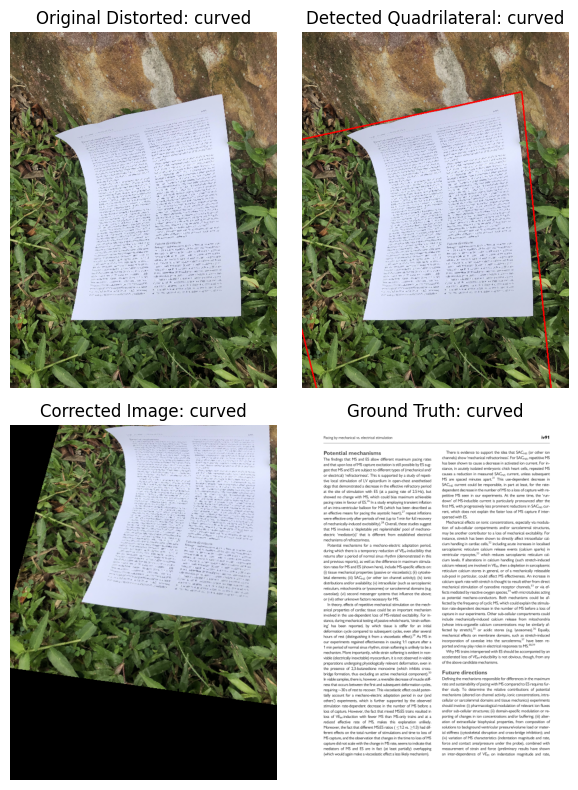

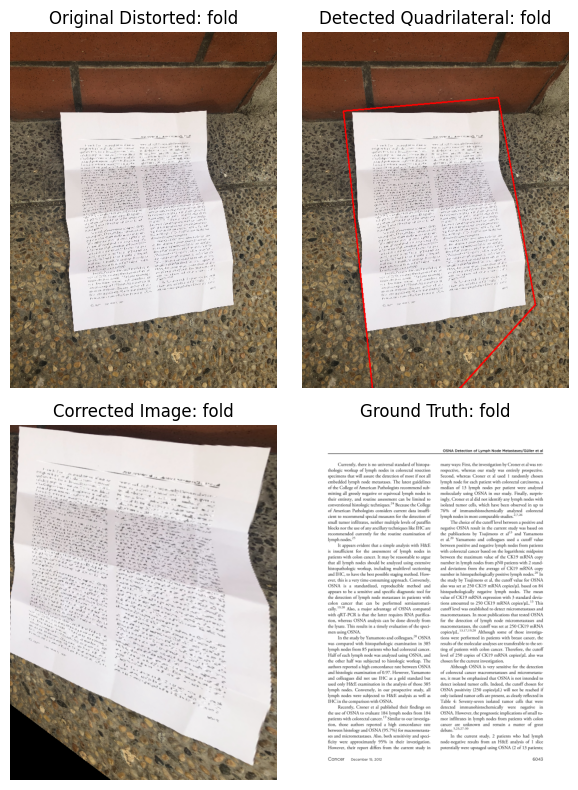

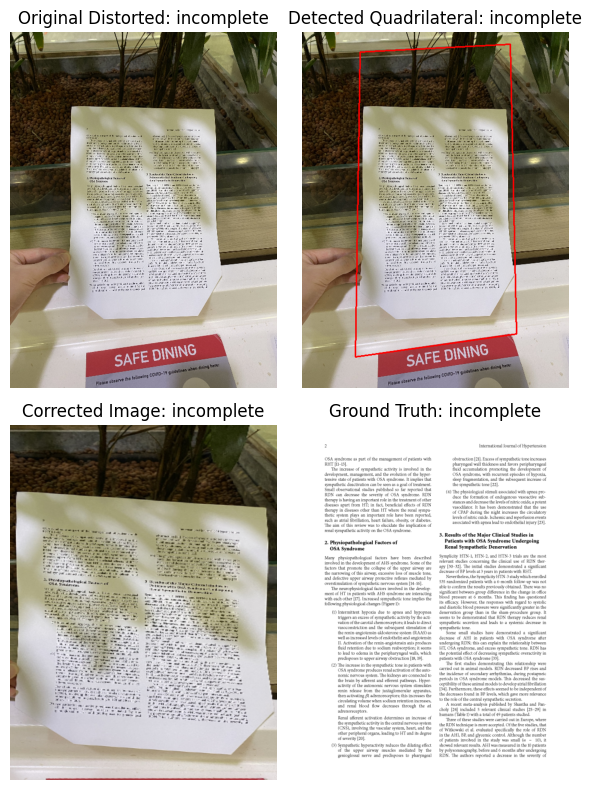

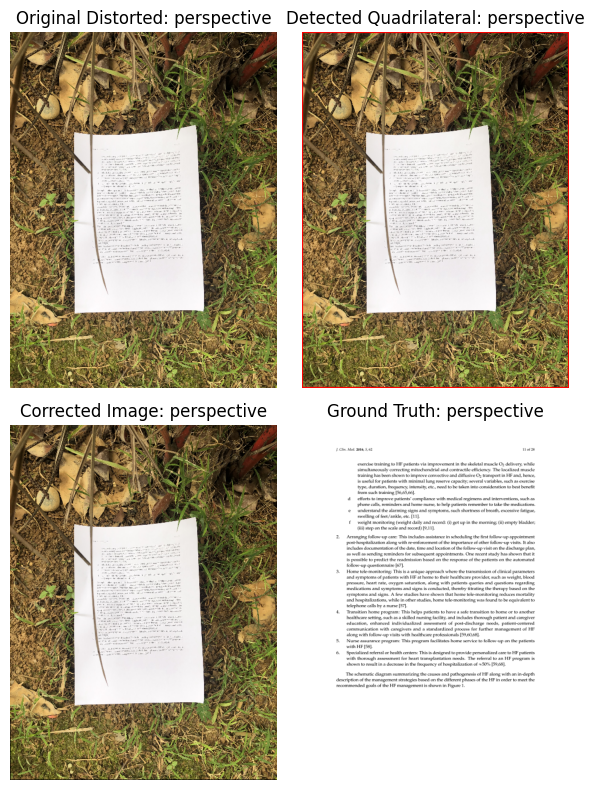

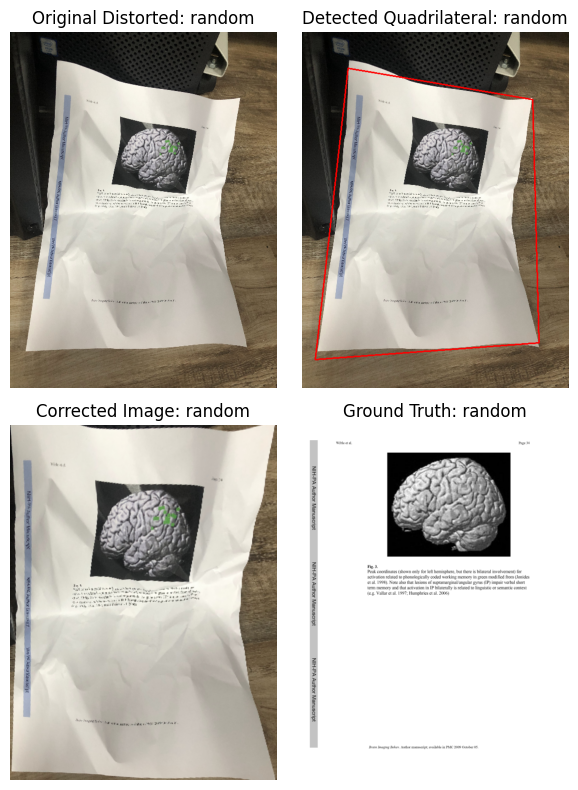

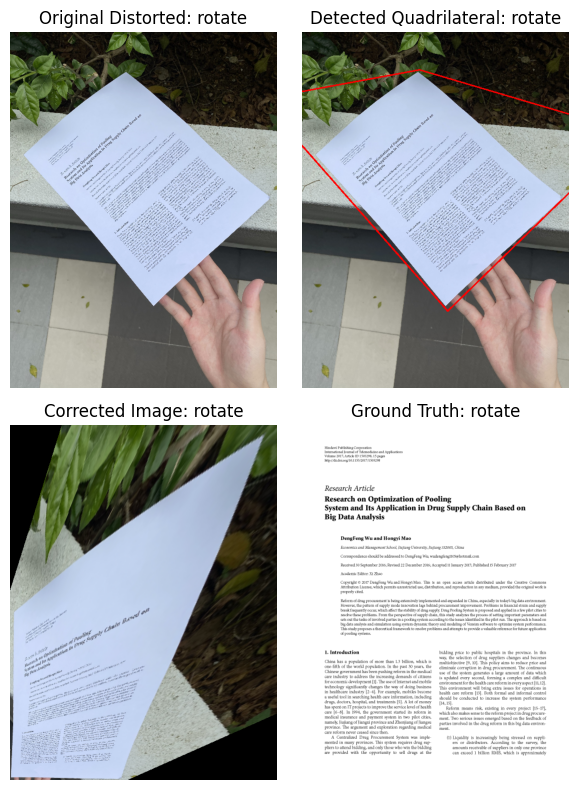

SSIM Scores by Category:
curved: 0.2550
fold: 0.2376
incomplete: 0.2282
perspective: 0.2343
random: 0.2450
rotate: 0.2157


In [104]:
detected_quads = {}
transformed_images = {}
ssim_scores = {}

from skimage.metrics import structural_similarity as ssim

for category in processed_images:
    detected_quads[category] = []
    transformed_images[category] = []
    ssim_scores[category] = []
    
    for i, edges in enumerate(processed_images[category]):
        # original distorted image
        dist_path = sorted(glob.glob(os.path.join(DISTORTED, category, "*.jpg")))[i]
        dist_image = cv2.imread(dist_path)
        scale = TARGET_WIDTH / dist_image.shape[1]
        dist_image = cv2.resize(dist_image, (TARGET_WIDTH, int(dist_image.shape[0] * scale)))
        
        v, t, r = votes[category][i], thetas[category][i], rhos[category][i]
        hough_lines_params = find_hough_peaks(v, t, r, threshold_ratio=0.3, max_lines=20)
        
        lines_abc_format = []
        for rho, theta in hough_lines_params:
            cos_t, sin_t = np.cos(theta), np.sin(theta)
            # (cos_t)x + (sin_t)y - rho = 0
            lines_abc_format.append((cos_t, sin_t, -rho))
        
        quad = find_quadrilateral(lines_abc_format, edges.shape)
        detected_quads[category].append(quad)
        
        transformed = apply_perspective_transform(dist_image, quad)
        transformed_images[category].append(transformed)
        
        gt_image = ground_truth[category][i]
        transformed_gray = cv2.cvtColor(transformed, cv2.COLOR_BGR2GRAY) if len(transformed.shape) > 2 else transformed
        
        # resize 
        if transformed_gray.shape != gt_image.shape:
            transformed_gray = cv2.resize(transformed_gray, (gt_image.shape[1], gt_image.shape[0]))
            
        score = ssim(transformed_gray, gt_image)
        ssim_scores[category].append(score)
        
        if i == 0:
            vis_image = dist_image.copy()
            cv2.polylines(vis_image, [np.int32(quad)], True, (0, 0, 255), 2)
            
            plt.figure(figsize=(6, 8))
            
            plt.subplot(2, 2, 1)
            plt.imshow(cv2.cvtColor(dist_image, cv2.COLOR_BGR2RGB))
            plt.title(f'Original Distorted: {category}')
            plt.axis('off')
            
            plt.subplot(2, 2, 2)
            plt.imshow(cv2.cvtColor(vis_image, cv2.COLOR_BGR2RGB))
            plt.title(f'Detected Quadrilateral: {category}')
            plt.axis('off')
            
            plt.subplot(2, 2, 3)
            plt.imshow(cv2.cvtColor(transformed, cv2.COLOR_BGR2RGB))
            plt.title(f'Corrected Image: {category}')
            plt.axis('off')
            
            plt.subplot(2, 2, 4)
            plt.imshow(gt_image, cmap='gray')
            plt.title(f'Ground Truth: {category}')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()

print("SSIM Scores by Category:")
for category in ssim_scores:
    avg_score = np.mean(ssim_scores[category])
    print(f"{category}: {avg_score:.4f}")